In [ ]:
!pip install networkx matplotlib seaborn scipy joblib fastobo goatools itables igraph python-louvain
import networkx as nx
import matplotlib.pyplot as plt

import matplotlib.patches as mpatches

import pandas as pd
import numpy as np

from scipy.stats import pearsonr
from joblib import Parallel, delayed

# import urllib.request
import fastobo
import json

import goatools
from goatools.obo_parser import GODag

import itables.options as opt
from itables import init_notebook_mode, show
from itables.downsample import as_nbytes, nbytes
from itables.sample_dfs import get_indicators

init_notebook_mode(all_interactive=False)
opt.maxBytes = "128KB"

import seaborn as sns

sns.set()
plt.style.use('default')
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.colors import ListedColormap, BoundaryNorm

import matplotlib.cm as cm
import matplotlib.colors as mcolors

from collections import Counter

import glob
import inspect

import igraph as ig
from community import community_louvain as com
import random

import os


  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 63.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.8/15.8 MB 85.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 57.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 78.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.9/159.9 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 63.0 MB/s eta 0:00:00
  Created wheel for docopt: filename=docopt-0.6.2-py2.py3-none-any.whl size=13706 sha256=517cea0ea037ce028a496b50ac7d1970ea8aabd41146a5004a3533acb4aa7f2a
  Stored in directory: /root/.cache/pip/wheels/fc/ab/d4/5da2067ac95b36618c629a5f93f809425700506f72c9732fac
Successfully built docopt


## Funciones que utilizo

In [ ]:
# Funciones para abrir archivos:

def abrir_txt(nombre_archivo):
    archivo=open(nombre_archivo)
    data=[]
    for linea in archivo:
        linea=linea.strip()
        columna=linea.split()
        data.append(columna)
    return data

def abrir_esenciales(nombre_archivo):
    archivo = open(nombre_archivo)
    data = []
    for linea in archivo:
        linea=linea.strip()
        columna=linea.split()
        data.append(columna)
    data = data[2:]
    esenciales = []
    for linea in data:
      if len(linea)>2:
        esenciales.append(linea[1])
    return(esenciales)

In [ ]:
# Funciones para graficar

def plot_grafo(grafo):
	pos_layout = nx.spring_layout(grafo, seed = 42)  # Layout para la posición de los nodos
	edges = grafo.edges(data=True)

	fig, axes = plt.subplots(1, 1, figsize = (10,10))

	for i, ax in enumerate(fig.axes):
		edge_colors = nx.get_edge_attributes(grafo, 'color').values()
		ax.set_facecolor('#141414')
		nx.draw_networkx_nodes(grafo,
							pos = pos_layout,
							node_color = '#cc5c14',
							ax = ax,
							node_size = 2, alpha = 0.4)

		nx.draw_networkx_edges(grafo, pos = pos_layout, ax = ax, alpha = .7, edge_color = edge_colors, width = 0.3)

In [ ]:
#Colores para enlaces
def assign_edge_colors(G):
    edge_colors = {2: 'plum',
        -2: 'lightseagreen'}

    nx.set_edge_attributes(G, {e: edge_colors.get(G[e[0]][e[1]]['weight'], 'black') for e in G.edges()}, 'color')

def asignar_color(peso, colores_tuple):
	if peso == 1:
		return colores_tuple[0]
	elif peso == 2:
		return colores_tuple[1]
	elif peso == 0.5:
		return colores_tuple[2]
	else:
		return 'gray'  # Opcional, para pesos no especificados

def asignar_colores_full(peso, colores_tuple):
	if peso == 1:
		return colores_tuple[0]
	elif peso == 2:
		return colores_tuple[1]
	elif peso == 0.5:
		return colores_tuple[2]
	elif peso == 0.3:
		return colores_tuple[3]
	elif peso == 0.1:
		return colores_tuple[4]
	else:
		return 'gray'  # Opcional, para pesos no especificados

def edge_colors_funcion(red_pesada, colores_tuple = ('white', 'plum', 'lightseagreen')):
    # Obtener pesos de los enlaces
	pesos = [data['weight'] for _, _, data in red_pesada.edges(data=True)]

	# Asignar colores basados en los pesos
	if len(colores_tuple) == 3:
		colores = [asignar_color(p, colores_tuple) for p in pesos]
	else:
		colores = [asignar_colores_full(p, colores_tuple) for p in pesos]

	return colores

In [ ]:
# Funciones para análisis de redes

def aplicar_louivan(red, resolucion = 1):# Louivan
	com_lv = com.best_partition(red, weight='weight', resolution = resolucion)

	print(f'La cantidad de comunas que maximiza la modularidad es: {max(com_lv.values()) + 1}')
	print(f'La modularidad de dicha partición es: {com.modularity(com_lv, red)}')

	return com_lv

def guardar_louivan(red, path, resolucion = 1):
	partition = aplicar_louivan(red, resolucion = resolucion)

	comunidades = {}
	for nodo, comunidad in partition.items():
		if comunidad not in comunidades:
			comunidades[comunidad] = []
		comunidades[comunidad].append(nodo)

	subgrafos = {}
	for comunidad, nodos in comunidades.items():
		subgrafo = red.subgraph(nodos).copy()
		subgrafos[comunidad] = subgrafo

		ruta = path+f"subgrafo_comunidad_{comunidad}.graphml"
		if not os.path.exists(path):
			os.makedirs(path)

		nx.write_graphml(subgrafo, ruta)

In [ ]:
def gigante(G):
	componentes = nx.connected_components(G)
	componentes = list(componentes)
	componentes.sort(key=len, reverse=True)
	componente_gigante = G.subgraph(componentes[0])
	return componente_gigante

def armar_componente_gigante(Red):
  Conjunto_nodos_en_gigante = max(nx.connected_components(Red), key=len)
  Componente_Gigante = Red.subgraph(Conjunto_nodos_en_gigante).copy()
  return Componente_Gigante

def elementos_tabla(Red):
	# Me quedo solo con la componente gigante
	Red_gigante = armar_componente_gigante(Red)

	nodos = Red_gigante.number_of_nodes()
	enlaces = Red_gigante.number_of_edges()
	promedio_grados = np.mean([grado for (nodo,grado) in list(Red_gigante.degree())])
	clustering = nx.average_clustering(Red_gigante)

	return (nodos,enlaces,promedio_grados,clustering)

In [ ]:
def centralidad_nodos(Red):
    num_nodes = len(Red.nodes())

    diccionario_grado = dict(Red.degree())
    diccionario_cercania = nx.closeness_centrality(Red, u=None, distance='weight', wf_improved=True)
    diccionario_betweenness = nx.betweenness_centrality(Red, weight='weight')
    diccionario_autovalor = nx.eigenvector_centrality(Red, max_iter=5000, tol=1e-06, nstart=None, weight='weight')

		# Normalizo por cantidad de nodos en la red
    diccionario_grado = {k: v / num_nodes for k, v in diccionario_grado.items()}
    diccionario_cercania = {k: v / num_nodes for k, v in diccionario_cercania.items()}
    diccionario_betweenness = {k: v / num_nodes for k, v in diccionario_betweenness.items()}
    diccionario_autovalor = {k: v / num_nodes for k, v in diccionario_autovalor.items()}

    return diccionario_grado, diccionario_cercania, diccionario_betweenness, diccionario_autovalor


def armar_tabla_centralidad(Red):

	diccionario_grado, diccionario_cercania, diccionario_betweenness, diccionario_autovalor = centralidad_nodos(Red)

	tabla = pd.DataFrame(columns = ['Nodo', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor'])
	for nodo in Red.nodes():
		df = pd.DataFrame({'Nodo' : nodo, 'Grado' : diccionario_grado[nodo], 'Cercanía' : diccionario_cercania[nodo],
						   'Betweenness' : diccionario_betweenness[nodo], 'Autovalor' : diccionario_autovalor[nodo]}, index=[0])
		tabla = pd.concat([tabla, df])
	tabla = tabla.reset_index(drop=True)
	return tabla

def porcentaje_mayor_valores(tabla, centralidad, porcentaje):
	tabla_ordenada = tabla.sort_values(by = [centralidad], ascending = False)

	tabla_ordenada = tabla_ordenada.reset_index(drop=True)
	cantidad = int(len(tabla_ordenada)*porcentaje)

	return tabla_ordenada[['Nodo', centralidad]][:cantidad]

def porcentaje_mayor_valores_javi(tabla, centralidad, porcentaje):
	tabla_ordenada = tabla.sort_values(by = [centralidad], ascending = False)
	numeros_ordenados = tabla_ordenada[centralidad]
	valor_cota = max(numeros_ordenados) - ((max(numeros_ordenados) - min(numeros_ordenados))*porcentaje)
	# print(valor_cota)
	tt = tabla_ordenada[tabla_ordenada[centralidad] >= valor_cota].copy()

	return tt[['Nodo', centralidad]]

def calcular_accuracy(tabla, lista_esenciales, porcentaje, calcular_porcentaje = 'standard'):
	keys = ['Grado', 'Cercanía', 'Betweenness', 'Autovalor']
	accuracy = {keys[0]:[], keys[1]:[], keys[2]:[], keys[3]:[]}

	for centralidad in keys:

		if calcular_porcentaje == 'standard':
			tabla_porcentaje = porcentaje_mayor_valores(tabla, centralidad, porcentaje)
		elif calcular_porcentaje == 'javi':
			tabla_porcentaje = porcentaje_mayor_valores_javi(tabla, centralidad, porcentaje)

		nodos_en_tabla = set(tabla_porcentaje['Nodo'])
		esenciales_en_tabla = [nodo for nodo in nodos_en_tabla if nodo in lista_esenciales]

		cantidad_top = len(tabla_porcentaje)

		exactitud = len(esenciales_en_tabla)/cantidad_top * 100
		accuracy[centralidad] = exactitud

	return accuracy

In [ ]:
Data_esenciales = abrir_txt('Essential_ORFs_paperHe.txt')
# print(Data_esenciales)

lista_esenciales = abrir_esenciales('Essential_ORFs_paperHe.txt')
# print (lista_esenciales)

## Con redes distintas

In [ ]:
import pickle
def funcion_analisis(archivo, path, resolucion = 1, porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5], metodo_porcentaje = 'standard', comp_gigante = False):

    if comp_gigante == False:
        with open(archivo, 'rb') as f:
            red_pesada = pickle.load(f)
        red_evaluar = red_pesada
    elif comp_gigante == True:
        with open(archivo, 'rb') as f:
            red_pesada = pickle.load(f)
        red_evaluar = gigante(red_pesada)

    guardar_louivan(red_evaluar, path, resolucion=resolucion)

    tabla1 = pd.DataFrame(columns = ['Comunidad', 'Nodos', 'Enlaces', 'Grado promedio', 'Coeficiente de clustering'])
    grafitos = sorted(list(glob.glob(path+'*.graphml')))
    grafitos_ordenados = sorted(grafitos, key=lambda x: int(x.split('_comunidad_')[1].split('.')[0]))

    for grafo in grafitos_ordenados:
        red = nx.read_graphml(grafo)
        nodos, enlaces, promedio_grados, clustering = elementos_tabla(red)

        name = grafo.split('_comunidad_')[1].split('.')[0]

        df = pd.DataFrame({'Comunidad' : name, 'Nodos' : nodos, 'Enlaces' : enlaces,
                           'Grado promedio' : promedio_grados, 'Coeficiente de clustering' : clustering}, index=[0])
        tabla1 = pd.concat([tabla1, df])

    tabla1 = tabla1.reset_index(drop=True)

    tabla_centralidades = pd.DataFrame(columns = ['Nodo', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor'])

    for grafo in grafitos_ordenados:
        Red = nx.read_graphml(grafo)
        tabla_aux = armar_tabla_centralidad(Red)
        tabla_centralidades = pd.concat([tabla_centralidades, tabla_aux])
        tabla_centralidades = tabla_centralidades.reset_index(drop=True)

    accuracy_df = pd.DataFrame(columns = ['Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor'])

    for porc in porcentaje:
        accuracy = calcular_accuracy(tabla_centralidades, lista_esenciales, porc, calcular_porcentaje = metodo_porcentaje)
        df = pd.DataFrame({'Porcentaje' : str(int(porc*100))+'%', 'Grado' : accuracy['Grado'], 'Cercanía' : accuracy['Cercanía'],
                           'Betweenness' : accuracy['Betweenness'], 'Autovalor' : accuracy['Autovalor']}, index=[0])
        accuracy_df = pd.concat([accuracy_df, df])

    accuracy_df = accuracy_df.reset_index(drop=True)

    return tabla1, tabla_centralidades, accuracy_df

In [ ]:
archivo = 'red_pesada-cota06.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_06, tabla_centralidades_06, accuracy_df_06 = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 214
La modularidad de dicha partición es: 0.7899497163020499


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
archivo = 'red_pesada-cota09+full.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1, tabla_centralidades, accuracy_df = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 179
La modularidad de dicha partición es: 0.7999316330264354


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
# Aplico el algoritmo a apms

archivo = 'apms.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_apms, tabla_centralidades_apms, accuracy_df_apms = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 212
La modularidad de dicha partición es: 0.7913790267781236


<ipython-input-53-31a9e9ca8736>:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla1 = pd.concat([tabla1, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-53-31a9e9ca8736>:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, 

In [ ]:
accuracy_df['Categoría'] = '09+full'
accuracy_df_06['Categoría'] = '06entera'
accuracy_df_apms['Categoría'] = 'apms'

df_final = pd.concat([accuracy_df_06, accuracy_df, accuracy_df_apms], ignore_index=True)

df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]
df_final

,Categoría,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,06entera,5%,3.806228,1.470588,3.027682,1.557093
1,06entera,10%,7.093426,3.200692,7.352941,3.460208
2,06entera,15%,9.429066,4.671280,10.813149,4.671280
3,06entera,20%,12.370242,6.314879,14.532872,6.141869
4,06entera,25%,15.051903,9.256055,18.166090,8.910035
5,06entera,30%,16.695502,11.851211,21.626298,11.937716
6,06entera,35%,18.512111,16.435986,24.567474,16.522491
7,06entera,40%,21.020761,18.598616,27.681661,19.031142
8,06entera,45%,25.173010,20.415225,30.536332,22.058824
9,06entera,50%,28.287197,24.307958,33.650519,26.470588


In [ ]:
categorias = df_final['Categoría'].unique()
porcentajes = df_final['Porcentaje'].unique()

metricas = ['Grado']

fig, ax = plt.subplots(figsize=(8, 5))

ancho_barra = 0.2
x_posiciones = np.arange(len(porcentajes))


for i, categoria in enumerate(categorias):
	df_categoria = df_final[df_final['Categoría'] == categoria]
	if categoria == '09+full':
		categoria = 'Red 09+full'
	elif categoria == '06entera':
		categoria = 'Red 06'
	elif categoria == 'apms':
		categoria = 'Red apms'

	print(categoria)
	for j, metrica in enumerate(metricas):
		ax.bar(x_posiciones + i * ancho_barra + j * ancho_barra / len(metricas),
               df_categoria[metrica],
               width=ancho_barra / len(metricas),
               label=categoria, alpha=0.7, edgecolor='black', linewidth=0.5, color = sns.color_palette('hls')[2*i])#, hatch = 'x')

ax.set_xticks(x_posiciones + (len(categorias) - 1) * ancho_barra / 2)
ax.set_xticklabels(porcentajes)
ax.set_xlabel('Porcentaje')
ax.set_ylabel('Valores Porcentuales')
ax.set_title(metrica)
plt.legend(loc='upper left')
plt.tight_layout()


In [ ]:
archivo = 'red_pesada-0.9-sinAPMS.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_09, tabla_centralidades_09, accuracy_df_09 = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 4124
La modularidad de dicha partición es: 0.8007348981030729


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
accuracy_df_09

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,14.790997,16.077170,16.398714,20.257235
1,10%,15.434084,15.594855,19.131833,18.649518
2,15%,17.363344,16.291533,18.863880,18.006431
3,20%,17.845659,16.237942,18.729904,16.559486
4,25%,18.199357,16.977492,18.713826,16.591640
5,30%,18.220793,17.899250,18.274384,16.720257
6,35%,18.603583,18.603583,18.649518,17.179605
7,40%,18.569132,18.569132,18.448553,16.800643
8,45%,18.113612,17.934977,18.399428,17.041801
9,50%,18.038585,17.974277,18.327974,17.041801


In [ ]:
accuracy_df_apms

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,38.666667,20.333333,36.000000,17.333333
1,10%,35.500000,21.833333,42.000000,17.833333
2,15%,31.888889,27.000000,39.222222,17.888889
3,20%,33.721898,29.392173,36.386345,17.485429
4,25%,33.910726,32.245170,30.979347,17.388408
5,30%,32.204331,32.093282,28.206552,17.379234
6,35%,30.366492,29.938125,25.416468,17.563065
7,40%,27.560366,27.643630,24.021649,17.110741
8,45%,25.240563,25.129534,22.538860,17.320503
9,50%,23.417722,23.451033,21.285809,17.288474


In [ ]:
accuracy_df_06

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,38.666667,20.333333,38.000000,17.000000
1,10%,34.333333,22.333333,42.166667,18.166667
2,15%,31.777778,27.333333,40.111111,18.111111
3,20%,33.750000,28.000000,38.833333,17.333333
4,25%,33.933333,31.933333,32.733333,17.333333
5,30%,32.222222,31.944444,29.611111,17.277778
6,35%,30.333333,29.857143,27.047619,17.476190
7,40%,27.666667,27.625000,25.083333,17.083333
8,45%,25.148148,25.259259,23.259259,17.222222
9,50%,23.433333,23.466667,21.933333,17.300000


In [ ]:
accuracy_df

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,19.638243,14.728682,26.614987,15.762274
1,10%,17.829457,15.762274,27.390181,16.666667
2,15%,21.619294,15.848407,27.217916,17.829457
3,20%,25.193798,18.281654,26.033592,17.635659
4,25%,25.116279,21.136951,25.684755,17.571059
5,30%,24.375538,21.231697,25.279931,17.700258
6,35%,22.960502,21.779254,23.145072,17.866371
7,40%,22.512920,21.834625,21.479328,17.926357
8,45%,21.676715,21.648005,20.671835,17.599770
9,50%,20.640661,20.847326,19.788168,17.256523


In [ ]:
accuracy_df['Categoría'] = 'Red 09+full'
accuracy_df_06['Categoría'] = 'Red 06'
accuracy_df_apms['Categoría'] = 'Red apms'
accuracy_df_09['Categoría'] = 'Red 09 sinAPMS'

df_final = pd.concat([accuracy_df_06, accuracy_df, accuracy_df_09, accuracy_df_apms], ignore_index=True)

df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]
df_final.head()

,Categoría,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,Red 06,5%,3.806228,1.470588,3.027682,1.557093
1,Red 06,10%,7.093426,3.200692,7.352941,3.460208
2,Red 06,15%,9.429066,4.671280,10.813149,4.671280
3,Red 06,20%,12.370242,6.314879,14.532872,6.141869
4,Red 06,25%,15.051903,9.256055,18.166090,8.910035


# Y2H

In [ ]:
# Aplico el algoritmo a apms

archivo = 'y2h.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_y2h, tabla_centralidades_y2h, accuracy_df_y2h = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 38
La modularidad de dicha partición es: 0.5145963912589815


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
archivo = 'red_pesada_y2h-cota06.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_06, tabla_centralidades_06, accuracy_df_06 = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 39
La modularidad de dicha partición es: 0.5181915564608635


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
archivo = 'red_pesada_y2h-cota09+full.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1, tabla_centralidades, accuracy_df = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 56
La modularidad de dicha partición es: 0.5447674556598882


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
archivo = 'red_pesada-0.9-sinAPMS.gpickle'
path = '/content/my_directory'

porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25, 0.3, 0.35, 0.4, 0.45, 0.5]

tabla1_09, tabla_centralidades_09, accuracy_df_09 = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje)

La cantidad de comunas que maximiza la modularidad es: 4123
La modularidad de dicha partición es: 0.8061064936360723


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

In [ ]:
accuracy_df_y2h

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,15.560641,16.018307,27.688787,17.391304
1,10%,23.455378,18.306636,27.574371,17.505721
2,15%,27.134146,19.131098,27.667683,16.768293
3,20%,26.014866,21.898228,26.529445,16.981132
4,25%,25.011431,21.719250,25.605853,16.460905
5,30%,23.056402,20.274390,23.971037,17.187500
6,35%,21.848465,19.823645,21.619856,17.635532
7,40%,20.834524,19.519863,20.120034,17.576450
8,45%,19.659639,19.126238,19.075438,17.221234
9,50%,18.770005,18.564243,18.038409,17.078189


In [ ]:
accuracy_df_06

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,15.560641,16.018307,27.917620,17.391304
1,10%,24.027460,16.819222,27.116705,17.620137
2,15%,27.591463,20.503049,27.134146,16.615854
3,20%,26.243568,22.641509,26.072041,16.866781
4,25%,25.011431,22.085048,25.743027,16.460905
5,30%,23.666159,21.417683,24.428354,17.225610
6,35%,21.790265,20.091473,22.051617,17.575956
7,40%,20.663047,19.291226,20.548728,17.519291
8,45%,19.588415,18.978659,19.105691,17.225610
9,50%,18.678555,18.449931,18.084134,17.009602


In [ ]:
accuracy_df

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,13.347458,13.983051,24.152542,18.432203
1,10%,18.008475,12.605932,25.000000,18.114407
2,15%,19.844633,15.889831,23.516949,17.019774
3,20%,20.762712,16.578390,23.622881,17.002119
4,25%,20.381356,17.881356,22.500000,17.796610
5,30%,20.515537,18.008475,21.362994,17.478814
6,35%,19.794189,18.008475,20.702179,17.584746
7,40%,19.094280,17.823093,19.412076,17.213983
8,45%,18.361582,17.796610,18.432203,16.972693
9,50%,17.919932,17.665749,17.348019,16.119466


In [ ]:
accuracy_df_09

,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,5%,13.183280,16.398714,16.398714,20.257235
1,10%,15.594855,15.916399,18.327974,18.810289
2,15%,17.256163,15.434084,18.435155,18.220793
3,20%,17.202572,15.755627,18.971061,16.800643
4,25%,17.684887,16.398714,18.842444,16.784566
5,30%,18.435155,17.470525,18.220793,16.827438
6,35%,18.695452,18.557648,18.465779,17.225540
7,40%,18.528939,18.528939,18.528939,16.921222
8,45%,18.185066,18.149339,18.327974,17.077528
9,50%,18.038585,17.942122,18.231511,17.041801


## Pruebo calculo de accuracy "Javi"

Ok

La cantidad de comunas que maximiza la modularidad es: 213
La modularidad de dicha partición es: 0.789826921237804


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 178
La modularidad de dicha partición es: 0.7999708268716119


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 4125
La modularidad de dicha partición es: 0.8026277788006051


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 212
La modularidad de dicha partición es: 0.7913790267781233


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

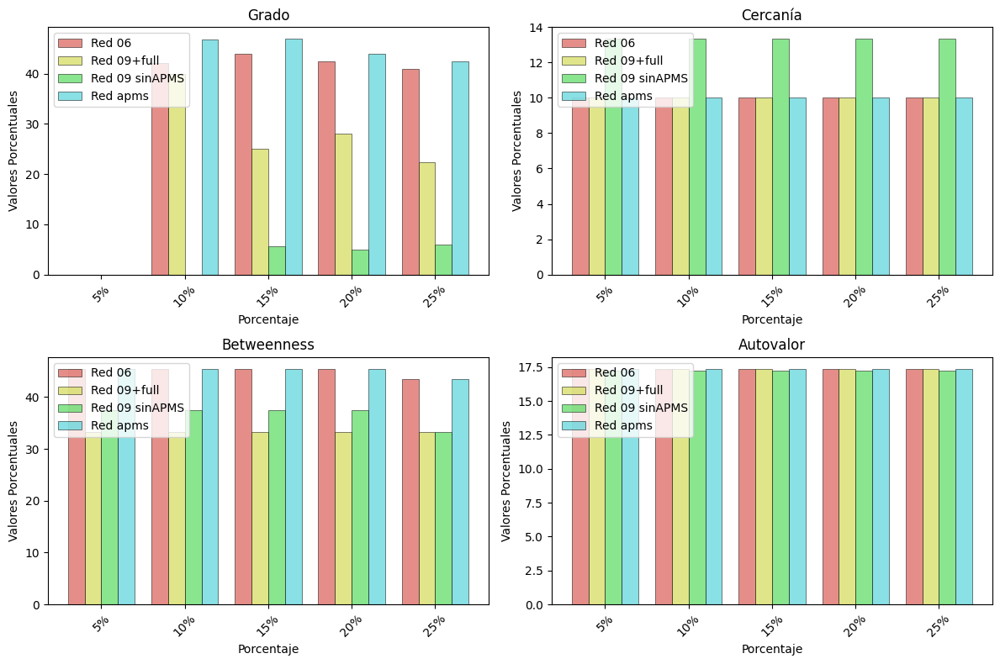

In [ ]:
porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25]

lista_archivo = ['red_pesada-cota06.gpickle', 'red_pesada-cota09+full.gpickle', 'red_pesada-0.9-sinAPMS.gpickle', 'apms.gpickle']
lista_path = ['/content/my_directory', '/content/my_directory', '/content/my_directory', '/content/my_directory']

lista_tabla1, lista_tabla_centralidades, lista_accuracy_df = [], [], []

for i in range(len(lista_archivo)):
	archivo = lista_archivo[i]
	path = lista_path[i]
	tabla1, tabla_centralidades, accuracy_df = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje, metodo_porcentaje = 'javi')
	lista_tabla1.append(tabla1)
	lista_tabla_centralidades.append(tabla_centralidades)
	lista_accuracy_df.append(accuracy_df)

lista_accuracy_df[0]['Categoría'] = 'Red 06'
lista_accuracy_df[1]['Categoría'] = 'Red 09+full'
lista_accuracy_df[2]['Categoría'] = 'Red 09 sinAPMS'
lista_accuracy_df[3]['Categoría'] = 'Red apms'

df_final = pd.concat([lista_accuracy_df[0], lista_accuracy_df[1], lista_accuracy_df[2], lista_accuracy_df[3]], ignore_index=True)

df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]

categorias = df_final['Categoría'].unique()
porcentajes = df_final['Porcentaje'].unique()

metricas = ['Grado', 'Cercanía', 'Betweenness', 'Autovalor']

fig, ax = plt.subplots(2, 2, figsize=(12, 8))  # Crear una cuadrícula de subplots 2x2

ancho_barra = 0.2
x_posiciones = np.arange(len(porcentajes))

# Iterar sobre las métricas y categorías
for k, metrica in enumerate(metricas):
    # Calcular la posición del subplot
    fila = k // 2
    columna = k % 2
    eje = ax[fila, columna]

    for i, categoria in enumerate(categorias):
        # print(i, categoria)
        df_categoria = df_final[df_final['Categoría'] == categoria]
        eje.bar(
            x_posiciones + i * ancho_barra,
            df_categoria[metrica],
            width=ancho_barra,
            label=categoria,
            alpha=0.7,
            edgecolor='black',
            linewidth=0.5,
            color=sns.color_palette('hls')[i]
        )

    # Configuración específica de cada subplot
    eje.set_xticks(x_posiciones + (len(categorias) - 1) * ancho_barra / 2)
    eje.set_xticklabels(porcentajes, rotation=45)
    eje.set_xlabel('Porcentaje')
    eje.set_ylabel('Valores Porcentuales')
    eje.set_title(metrica)
    eje.legend(loc='upper left')

# Ajustar espaciado entre subplots
plt.tight_layout()

In [ ]:
df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]
df_final

,Categoría,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,Red 06,5%,0.000000,10.000000,45.454545,17.370769
1,Red 06,10%,42.105263,10.000000,45.454545,17.370769
2,Red 06,15%,43.956044,10.000000,45.454545,17.370769
3,Red 06,20%,42.500000,10.000000,45.454545,17.370769
4,Red 06,25%,40.957447,10.000000,43.478261,17.370769
5,Red 09+full,5%,0.000000,10.000000,33.333333,17.370769
6,Red 09+full,10%,40.000000,10.000000,33.333333,17.370769
7,Red 09+full,15%,25.000000,10.000000,33.333333,17.370769
8,Red 09+full,20%,28.000000,10.000000,33.333333,17.370769
9,Red 09+full,25%,22.340426,10.000000,33.333333,17.370769


A
ccuracy alternativo

La cantidad de comunas que maximiza la modularidad es: 39
La modularidad de dicha partición es: 0.5211949280747304


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 57
La modularidad de dicha partición es: 0.5402225353579895


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 4126
La modularidad de dicha partición es: 0.8007774497871102


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

La cantidad de comunas que maximiza la modularidad es: 39
La modularidad de dicha partición es: 0.5078069975460712


Se han truncado las últimas 5000 líneas del flujo de salida.
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-52-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when 

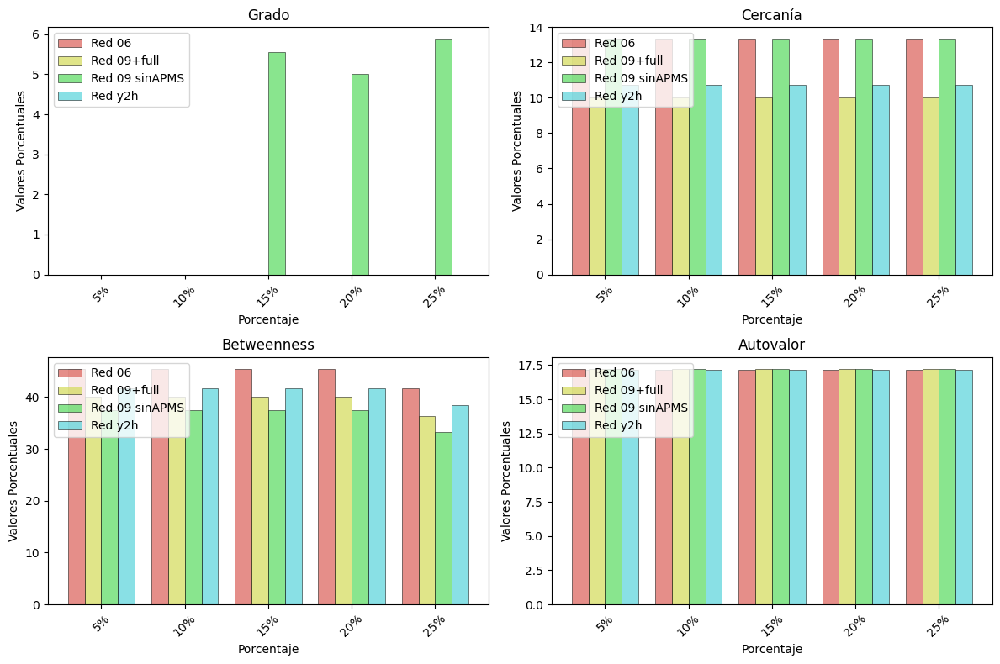

In [ ]:
porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25]

lista_archivo = ['red_pesada_y2h-cota06.gpickle', 'red_pesada_y2h-cota09+full.gpickle', 'red_pesada-0.9-sinAPMS.gpickle', 'y2h.gpickle']
lista_path = ['/content/my_directory', '/content/my_directory', '/content/my_directory', '/content/my_directory']

lista_tabla1, lista_tabla_centralidades, lista_accuracy_df = [], [], []

for i in range(len(lista_archivo)):
	archivo = lista_archivo[i]
	path = lista_path[i]
	tabla1, tabla_centralidades, accuracy_df = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje, metodo_porcentaje = 'javi')
	lista_tabla1.append(tabla1)
	lista_tabla_centralidades.append(tabla_centralidades)
	lista_accuracy_df.append(accuracy_df)

lista_accuracy_df[0]['Categoría'] = 'Red 06'
lista_accuracy_df[1]['Categoría'] = 'Red 09+full'
lista_accuracy_df[2]['Categoría'] = 'Red 09 sinAPMS'
lista_accuracy_df[3]['Categoría'] = 'Red y2h'

df_final = pd.concat([lista_accuracy_df[0], lista_accuracy_df[1], lista_accuracy_df[2], lista_accuracy_df[3]], ignore_index=True)

df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]

categorias = df_final['Categoría'].unique()
porcentajes = df_final['Porcentaje'].unique()

metricas = ['Grado', 'Cercanía', 'Betweenness', 'Autovalor']

fig, ax = plt.subplots(2, 2, figsize=(12, 8))  # Crear una cuadrícula de subplots 2x2

ancho_barra = 0.2
x_posiciones = np.arange(len(porcentajes))

# Iterar sobre las métricas y categorías
for k, metrica in enumerate(metricas):
    # Calcular la posición del subplot
    fila = k // 2
    columna = k % 2
    eje = ax[fila, columna]

    for i, categoria in enumerate(categorias):
        # print(i, categoria)
        df_categoria = df_final[df_final['Categoría'] == categoria]
        eje.bar(
            x_posiciones + i * ancho_barra,
            df_categoria[metrica],
            width=ancho_barra,
            label=categoria,
            alpha=0.7,
            edgecolor='black',
            linewidth=0.5,
            color=sns.color_palette('hls')[i]
        )

    # Configuración específica de cada subplot
    eje.set_xticks(x_posiciones + (len(categorias) - 1) * ancho_barra / 2)
    eje.set_xticklabels(porcentajes, rotation=45)
    eje.set_xlabel('Porcentaje')
    eje.set_ylabel('Valores Porcentuales')
    eje.set_title(metrica)
    eje.legend(loc='upper left')

# Ajustar espaciado entre subplots
plt.tight_layout()

In [ ]:
df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]
df_final

,Categoría,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,Red 06,5%,0.000000,13.636364,50.000000,17.366212
1,Red 06,10%,0.000000,13.636364,50.000000,17.366212
2,Red 06,15%,0.000000,13.636364,50.000000,17.366212
3,Red 06,20%,0.000000,13.636364,50.000000,17.366212
4,Red 06,25%,0.000000,13.636364,47.826087,17.366212
5,Red 09+full,5%,0.000000,10.000000,47.619048,17.366212
6,Red 09+full,10%,0.000000,10.000000,47.619048,17.366212
7,Red 09+full,15%,0.000000,10.000000,47.619048,17.366212
8,Red 09+full,20%,0.000000,10.000000,47.619048,17.366212
9,Red 09+full,25%,0.000000,10.000000,45.454545,17.366212


## Pruebo solo con componentes gigantes de cada red

In [ ]:
porcentaje = [0.05, 0.1, 0.15, 0.2, 0.25]

lista_archivo = ['red_pesada-cota06.gpickle', 'red_pesada-cota09+full.gpickle', 'red_pesada-0.9-sinAPMS.gpickle', 'apms.gpickle']
lista_path = ['/content/my_directory', '/content/my_directory', '/content/my_directory', '/content/my_directory']

lista_tabla1, lista_tabla_centralidades, lista_accuracy_df = [], [], []

for i in range(len(lista_archivo)):
	print('Analizando archivo: ', lista_archivo[i][:-8])
	archivo = lista_archivo[i]
	path = lista_path[i]
	tabla1, tabla_centralidades, accuracy_df = funcion_analisis(archivo, path, resolucion = 1, porcentaje=porcentaje, metodo_porcentaje = 'standard', comp_gigante = True)
	lista_tabla1.append(tabla1)
	lista_tabla_centralidades.append(tabla_centralidades)
	lista_accuracy_df.append(accuracy_df)

Analizando archivo:  red_pesada-cota06
La cantidad de comunas que maximiza la modularidad es: 24
La modularidad de dicha partición es: 0.7596154482777835


<ipython-input-11-31a9e9ca8736>:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla1 = pd.concat([tabla1, df])
<ipython-input-8-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-11-31a9e9ca8736>:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, e

Analizando archivo:  red_pesada-cota09+full
La cantidad de comunas que maximiza la modularidad es: 37
La modularidad de dicha partición es: 0.7948397339219473


<ipython-input-11-31a9e9ca8736>:27: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla1 = pd.concat([tabla1, df])
<ipython-input-8-06f3535d4f8f>:26: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  tabla = pd.concat([tabla, df])
<ipython-input-11-31a9e9ca8736>:36: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, e

In [ ]:
lista_accuracy_df[0]['Categoría'] = 'Red 06'
lista_accuracy_df[1]['Categoría'] = 'Red 09+full'
lista_accuracy_df[2]['Categoría'] = 'Red 09 sinAPMS'
lista_accuracy_df[3]['Categoría'] = 'Red apms'

df_final = pd.concat([lista_accuracy_df[0], lista_accuracy_df[1], lista_accuracy_df[2], lista_accuracy_df[3]], ignore_index=True)

df_final = df_final[['Categoría', 'Porcentaje', 'Grado', 'Cercanía', 'Betweenness', 'Autovalor']]
df_final.head(15)

,Categoría,Porcentaje,Grado,Cercanía,Betweenness,Autovalor
0,Red 06,5%,2.681661,2.249135,3.200692,1.730104
1,Red 06,10%,7.612457,3.979239,6.574394,2.854671
2,Red 06,15%,10.207612,6.055363,10.294118,5.103806
3,Red 06,20%,12.802768,8.391003,13.84083,8.044983
4,Red 06,25%,16.868512,11.245675,16.608997,10.121107
5,Red 06,30%,20.761246,12.716263,19.809689,13.84083
6,Red 06,35%,23.010381,15.138408,22.923875,17.733564
7,Red 06,40%,26.124567,18.598616,25.778547,20.761246
8,Red 06,45%,29.584775,22.058824,28.546713,23.961938
9,Red 06,50%,32.439446,25.778547,31.228374,27.422145


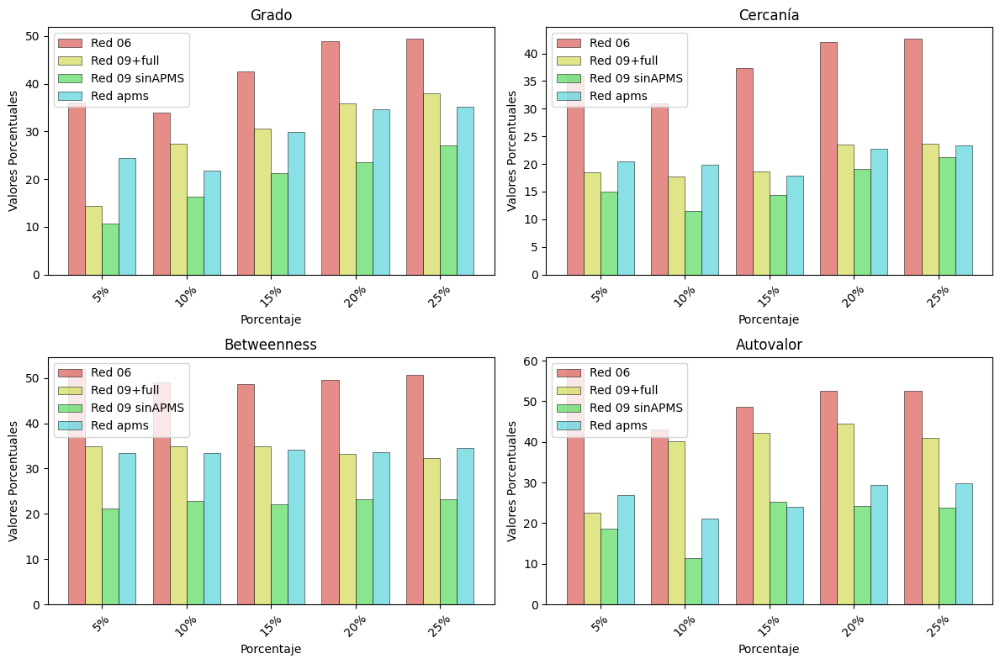

In [ ]:
categorias = df_final['Categoría'].unique()
porcentajes = df_final['Porcentaje'].unique()

metricas = ['Grado', 'Cercanía', 'Betweenness', 'Autovalor']

fig, ax = plt.subplots(2, 2, figsize=(12, 8))  # Crear una cuadrícula de subplots 2x2

ancho_barra = 0.2
x_posiciones = np.arange(len(porcentajes))

# Iterar sobre las métricas y categorías
for k, metrica in enumerate(metricas):
    # Calcular la posición del subplot
    fila = k // 2
    columna = k % 2
    eje = ax[fila, columna]

    for i, categoria in enumerate(categorias):
        # print(i, categoria)
        df_categoria = df_final[df_final['Categoría'] == categoria]
        eje.bar(
            x_posiciones + i * ancho_barra,
            df_categoria[metrica],
            width=ancho_barra,
            label=categoria,
            alpha=0.7,
            edgecolor='black',
            linewidth=0.5,
            color=sns.color_palette('hls')[i]
        )

    # Configuración específica de cada subplot
    eje.set_xticks(x_posiciones + (len(categorias) - 1) * ancho_barra / 2)
    eje.set_xticklabels(porcentajes, rotation=45)
    eje.set_xlabel('Porcentaje')
    eje.set_ylabel('Valores Porcentuales')
    eje.set_title(metrica)
    eje.legend(loc='upper left')

# Ajustar espaciado entre subplots
plt.tight_layout()